In [13]:
import numpy as np
import pandas as pd
import nibabel as nib
import glob
import matplotlib.pyplot as plt
from tifffile import imsave
from sklearn.preprocessing import MinMaxScaler
import random
from tqdm import tqdm
from skimage.transform import resize
import tensorflow as tf
from tensorflow.keras.layers import Input, Flatten, Conv3D, MaxPooling3D, Conv3DTranspose, concatenate, ReLU, Activation
from tensorflow.keras.models import Model
from sklearn.metrics import confusion_matrix as cm
from sklearn.model_selection import train_test_split

In [14]:
import os

def remove_folder_contents(folder):
    for the_file in os.listdir(folder):
        file_path = os.path.join(folder, the_file)
        try:
            if os.path.isfile(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                remove_folder_contents(file_path)
                os.rmdir(file_path)
        except Exception as e:
            print(e)

folder_path = '/kaggle/working/'
remove_folder_contents(folder_path)

In [15]:
t1_list = sorted(glob.glob('/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*/*t1.nii'))
t2_list = sorted(glob.glob('/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*/*t2.nii'))
t1ce_list = sorted(glob.glob('/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*/*t1ce.nii'))
flair_list = sorted(glob.glob('/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*/*flair.nii'))

In [16]:
dataframe = pd.read_csv("/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/name_mapping.csv")

In [17]:
dataframe.head()

,Grade,BraTS_2017_subject_ID,BraTS_2018_subject_ID,TCGA_TCIA_subject_ID,BraTS_2019_subject_ID,BraTS_2020_subject_ID
0,HGG,Brats17_CBICA_AAB_1,Brats18_CBICA_AAB_1,NaN,BraTS19_CBICA_AAB_1,BraTS20_Training_001
1,HGG,Brats17_CBICA_AAG_1,Brats18_CBICA_AAG_1,NaN,BraTS19_CBICA_AAG_1,BraTS20_Training_002
2,HGG,Brats17_CBICA_AAL_1,Brats18_CBICA_AAL_1,NaN,BraTS19_CBICA_AAL_1,BraTS20_Training_003
3,HGG,Brats17_CBICA_AAP_1,Brats18_CBICA_AAP_1,NaN,BraTS19_CBICA_AAP_1,BraTS20_Training_004
4,HGG,Brats17_CBICA_ABB_1,Brats18_CBICA_ABB_1,NaN,BraTS19_CBICA_ABB_1,BraTS20_Training_005


In [18]:
df = dataframe.drop(['BraTS_2017_subject_ID','BraTS_2018_subject_ID','TCGA_TCIA_subject_ID','BraTS_2019_subject_ID','BraTS_2020_subject_ID'], axis=1)

In [19]:
array = np.random.rand(64, 64, 64, 4)
df['Image'] = [array] * len(df)

In [20]:
df.at[0,'Image'].shape

(64, 64, 64, 4)

In [21]:
target_size = (64, 64, 64)
scaling_factors = np.array((240,240,155)) / np.array(target_size)

def resize_nii_image(nii_img):
    image_data = nii_img.get_fdata()
    affine = nii_img.affine
    resized_image = resize(image_data, target_size, mode='constant', anti_aliasing=True)
    new_affine = affine.copy()
    new_affine[:3, :3] = affine[:3, :3] * scaling_factors[:3]
    resized_nii_img = nib.Nifti1Image(resized_image, new_affine)
    resized_nii_img.header.set_data_shape(target_size)
    return resized_nii_img


In [22]:
count=0
scaler = MinMaxScaler()
for img in range(len(t1ce_list)):
    temp_image_t1=resize_nii_image(nib.load(t1_list[img])).get_fdata()
    temp_image_t1=scaler.fit_transform(temp_image_t1.reshape(-1, temp_image_t1.shape[-1])).reshape(temp_image_t1.shape)
    
    temp_image_t2=resize_nii_image(nib.load(t2_list[img])).get_fdata()
    temp_image_t2=scaler.fit_transform(temp_image_t2.reshape(-1, temp_image_t2.shape[-1])).reshape(temp_image_t2.shape)
    
    temp_image_t1ce=resize_nii_image(nib.load(t1ce_list[img])).get_fdata()
    temp_image_t1ce=scaler.fit_transform(temp_image_t1ce.reshape(-1, temp_image_t1ce.shape[-1])).reshape(temp_image_t1ce.shape)
    
    temp_image_flair=resize_nii_image(nib.load(flair_list[img])).get_fdata()
    temp_image_flair=scaler.fit_transform(temp_image_flair.reshape(-1, temp_image_flair.shape[-1])).reshape(temp_image_flair.shape)
    
    temp_combined_images=np.stack([temp_image_t1, temp_image_t1ce, temp_image_t2, temp_image_flair], axis=3)
    df.at[img,'Image']=temp_combined_images
    print(count)
    del temp_combined_images, temp_image_t1, temp_image_t2, temp_image_t1ce, temp_image_flair
    count+=1
    break
del count

0


In [10]:
df = df[['Image','Grade']]

In [11]:
import gc
gc.collect()

319

In [ ]:
data_array = df.to_numpy()

# Save as .npy file
np.save('data_array.npy', data_array)
print("Complete save")

In [ ]:
loaded_array = np.load('data_array.npy', allow_pickle=True)

In [3]:
import torch

# Load the file
pt_file = torch.load("/kaggle/input/monai_base/pytorch/base_pt/1/model.pt",map_location=torch.device('cpu'))

# Print the head of the file

/tmp/ipykernel_36/2816859878.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pt_file = torch.load("/kaggle/input/monai_base/pytorch/base_pt/1/model.pt",map_location=torc

In [6]:
pt_file.__dict__

{'_metadata': OrderedDict([('', {'version': 1}),
              ('act_mod', {'version': 1}),
              ('convInit', {'version': 1}),
              ('convInit.conv', {'version': 1}),
              ('down_layers', {'version': 1}),
              ('down_layers.0', {'version': 1}),
              ('down_layers.0.0', {'version': 1}),
              ('down_layers.0.1', {'version': 1}),
              ('down_layers.0.1.norm1', {'version': 1}),
              ('down_layers.0.1.norm2', {'version': 1}),
              ('down_layers.0.1.act', {'version': 1}),
              ('down_layers.0.1.conv1', {'version': 1}),
              ('down_layers.0.1.conv1.conv', {'version': 1}),
              ('down_layers.0.1.conv2', {'version': 1}),
              ('down_layers.0.1.conv2.conv', {'version': 1}),
              ('down_layers.1', {'version': 1}),
              ('down_layers.1.0', {'version': 1}),
              ('down_layers.1.0.conv', {'version': 1}),
              ('down_layers.1.1', {'version': 1}),
   

In [3]:
def adjusted_unet_3d_model(input_size=(64, 64, 64, 4)):
    inputs = Input(input_size)
    
    # Downsampling path (encoder) - with multiple convolutions
    c1 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling3D((2, 2, 2))(c1)
    
    c2 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(p1)
    c2 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling3D((2, 2, 2))(c2)
    
    c3 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(p2)
    c3 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling3D((2, 2, 2))(c3)
    
    # Bottleneck
    c4 = Conv3D(256, (3, 3, 3), activation='relu', padding='same')(p3)
    c4 = Conv3D(256, (3, 3, 3), activation='relu', padding='same')(c4)
    
    # Upsampling path (decoder) with Conv3DTranspose for upsampling
    u1 = Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(c4)
    merge1 = concatenate([u1, c3], axis=4)
    c5 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(merge1)
    c5 = Conv3D(128, (3, 3, 3), activation='relu', padding='same')(c5)
    
    u2 = Conv3DTranspose(64, (2, 2, 2), strides=(2, 2, 2), padding='same')(c5)
    merge2 = concatenate([u2, c2], axis=4)
    c6 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(merge2)
    c6 = Conv3D(64, (3, 3, 3), activation='relu', padding='same')(c6)
    
    u3 = Conv3DTranspose(32, (2, 2, 2), strides=(2, 2, 2), padding='same')(c6)
    merge3 = concatenate([u3, c1], axis=4)
    c7 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(merge3)
    c7 = Conv3D(32, (3, 3, 3), activation='relu', padding='same')(c7)
    
    # Output layer for segmentation
    output = Conv3D(1, (1, 1, 1), activation='sigmoid')(c7)
    
    model = Model(inputs=inputs, outputs=output)
    return model

model = adjusted_unet_3d_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 64, 64,    │      3,488 │ input_layer[0][0] │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 64, 64,    │     27,680 │ conv3d[0][0]      │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d       │ (None, 32, 32,    │          0 │ conv3d_1[0][0]    │
│ (MaxPooling3D)      │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 32, 32,    │     55,360 │ max_pooling3d[0]… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 32, 32,    │    110,656 │ conv3d_2[0][0]    │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_1     │ (None, 16, 16,    │          0 │ conv3d_3[0][0]    │
│ (MaxPooling3D)      │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 16, 16,    │    221,312 │ max_pooling3d_1[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 16, 16,    │    442,496 │ conv3d_4[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_2     │ (None, 8, 8, 8,   │          0 │ conv3d_5[0][0]    │
│ (MaxPooling3D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_6 (Conv3D)   │ (None, 8, 8, 8,   │    884,992 │ max_pooling3d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_7 (Conv3D)   │ (None, 8, 8, 8,   │  1,769,728 │ conv3d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_transpose    │ (None, 16, 16,    │    262,272 │ conv3d_7[0][0]    │
│ (Conv3DTranspose)   │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 16, 16,    │          0 │ conv3d_transpose… │
│ (Concatenate)       │ 16, 256)          │            │ conv3d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_8 (Conv3D)   │ (None, 16, 16,    │    884,864 │ concatenate[0][0] │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_9 (Conv3D)   │ (None, 16, 16,    │    442,496 │ conv3d_8[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_transpose_1  │ (None, 32, 32,    │     65,600 │ conv3d_9[0][0]  

 Total params: 5,602,305 (21.37 MB)

 Trainable params: 5,602,305 (21.37 MB)

 Non-trainable params: 0 (0.00 B)

In [4]:
model.save("sample_3D-Unet.h5")

In [5]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, Conv3DTranspose, concatenate, ReLU
from tensorflow.keras.models import Model

def adjusted_unet_3d_model(input_size=(64, 64, 64, 4)):
    inputs = Input(input_size)
    
    # Downsampling path (encoder) - with multiple convolutions
    c1 = Conv3D(32, (3, 3, 3), padding='same')(inputs)
    c1 = ReLU()(c1)
    c1 = Conv3D(32, (3, 3, 3), padding='same')(c1)
    c1 = ReLU()(c1)
    p1 = MaxPooling3D((2, 2, 2))(c1)
    
    c2 = Conv3D(64, (3, 3, 3), padding='same')(p1)
    c2 = ReLU()(c2)
    c2 = Conv3D(64, (3, 3, 3), padding='same')(c2)
    c2 = ReLU()(c2)
    p2 = MaxPooling3D((2, 2, 2))(c2)
    
    c3 = Conv3D(128, (3, 3, 3), padding='same')(p2)
    c3 = ReLU()(c3)
    c3 = Conv3D(128, (3, 3, 3), padding='same')(c3)
    c3 = ReLU()(c3)
    p3 = MaxPooling3D((2, 2, 2))(c3)
    
    # Bottleneck
    c4 = Conv3D(256, (3, 3, 3), padding='same')(p3)
    c4 = ReLU()(c4)
    c4 = Conv3D(256, (3, 3, 3), padding='same')(c4)
    c4 = ReLU()(c4)
    
    # Upsampling path (decoder) with Conv3DTranspose for upsampling
    u1 = Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(c4)
    merge1 = concatenate([u1, c3], axis=4)
    c5 = Conv3D(128, (3, 3, 3), padding='same')(merge1)
    c5 = ReLU()(c5)
    c5 = Conv3D(128, (3, 3, 3), padding='same')(c5)
    c5 = ReLU()(c5)
    
    u2 = Conv3DTranspose(64, (2, 2, 2), strides=(2, 2, 2), padding='same')(c5)
    merge2 = concatenate([u2, c2], axis=4)
    c6 = Conv3D(64, (3, 3, 3), padding='same')(merge2)
    c6 = ReLU()(c6)
    c6 = Conv3D(64, (3, 3, 3), padding='same')(c6)
    c6 = ReLU()(c6)
    
    u3 = Conv3DTranspose(32, (2, 2, 2), strides=(2, 2, 2), padding='same')(c6)
    merge3 = concatenate([u3, c1], axis=4)
    c7 = Conv3D(32, (3, 3, 3), padding='same')(merge3)
    c7 = ReLU()(c7)
    c7 = Conv3D(32, (3, 3, 3), padding='same')(c7)
    c7 = ReLU()(c7)
    
    # Output layer for segmentation
    output = Conv3D(1, (1, 1, 1), activation='sigmoid')(c7)
    
    model = Model(inputs=inputs, outputs=output)
    return model

model = adjusted_unet_3d_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_15 (Conv3D)  │ (None, 64, 64,    │      3,488 │ input_layer_1[0]… │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ conv3d_15[0][0]   │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_16 (Conv3D)  │ (None, 64, 64,    │     27,680 │ re_lu[0][0]       │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 64, 64,    │          0 │ conv3d_16[0][0]   │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_3     │ (None, 32, 32,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling3D)      │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_17 (Conv3D)  │ (None, 32, 32,    │     55,360 │ max_pooling3d_3[… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_17[0][0]   │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_18 (Conv3D)  │ (None, 32, 32,    │    110,656 │ re_lu_2[0][0]     │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_18[0][0]   │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_4     │ (None, 16, 16,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling3D)      │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_19 (Conv3D)  │ (None, 16, 16,    │    221,312 │ max_pooling3d_4[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_4 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_19[0][0]   │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_20 (Conv3D)  │ (None, 16, 16,    │    442,496 │ re_lu_4[0][0]     │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_5 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_20[0][0]   │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_5     │ (None, 8, 8, 8,   │          0 │ re_lu_5[0][0]     │
│ (MaxPooling3D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_21 (Conv3D)  │ (None, 8, 8, 8,   │    884,992 │ max_pooling3d_5[

 Total params: 5,602,305 (21.37 MB)

 Trainable params: 5,602,305 (21.37 MB)

 Non-trainable params: 0 (0.00 B)

In [6]:
model.save("sample_3D-Unet1.h5")

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, Conv3DTranspose, concatenate, ReLU, Activation
from tensorflow.keras.models import Model

def adjusted_unet_3d_model(input_size=(64, 64, 64, 4)):
    inputs = Input(input_size)
    
    # Downsampling path (encoder) - with multiple convolutions
    c1 = Conv3D(32, (3, 3, 3), padding='same')(inputs)
    c1 = ReLU()(c1)
    c1 = Conv3D(32, (3, 3, 3), padding='same')(c1)
    c1 = ReLU()(c1)
    p1 = MaxPooling3D((2, 2, 2))(c1)
    
    c2 = Conv3D(64, (3, 3, 3), padding='same')(p1)
    c2 = ReLU()(c2)
    c2 = Conv3D(64, (3, 3, 3), padding='same')(c2)
    c2 = ReLU()(c2)
    p2 = MaxPooling3D((2, 2, 2))(c2)
    
    c3 = Conv3D(128, (3, 3, 3), padding='same')(p2)
    c3 = ReLU()(c3)
    c3 = Conv3D(128, (3, 3, 3), padding='same')(c3)
    c3 = ReLU()(c3)
    p3 = MaxPooling3D((2, 2, 2))(c3)
    
    # Bottleneck
    c4 = Conv3D(256, (3, 3, 3), padding='same')(p3)
    c4 = ReLU()(c4)
    c4 = Conv3D(256, (3, 3, 3), padding='same')(c4)
    c4 = ReLU()(c4)
    
    # Upsampling path (decoder) with Conv3DTranspose for upsampling
    u1 = Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(c4)
    merge1 = concatenate([u1, c3], axis=1)  # Concatenate along axis 1
    c5 = Conv3D(128, (3, 3, 3), padding='same')(merge1)
    c5 = ReLU()(c5)
    c5 = Conv3D(128, (3, 3, 3), padding='same')(c5)
    c5 = ReLU()(c5)
    
    u2 = Conv3DTranspose(64, (2, 2, 2), strides=(2, 2, 2), padding='same')(c5)
    merge2 = concatenate([u2, c2], axis=1)  # Concatenate along axis 1
    c6 = Conv3D(64, (3, 3, 3), padding='same')(merge2)
    c6 = ReLU()(c6)
    c6 = Conv3D(64, (3, 3, 3), padding='same')(c6)
    c6 = ReLU()(c6)
    
    u3 = Conv3DTranspose(32, (2, 2, 2), strides=(2, 2, 2), padding='same')(c6)
    merge3 = concatenate([u3, c1], axis=1)  # Concatenate along axis 1
    c7 = Conv3D(32, (3, 3, 3), padding='same')(merge3)
    c7 = ReLU()(c7)
    c7 = Conv3D(32, (3, 3, 3), padding='same')(c7)
    c7 = ReLU()(c7)
    
    # Output layer (Conv3D without activation)
    output = Conv3D(1, (1, 1, 1), padding='same')(c7)
    
    # Sigmoid activation applied separately outside the Conv3D layer
    output = Activation('sigmoid')(output)
    
    model = Model(inputs=inputs, outputs=output)
    return model

model = adjusted_unet_3d_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_30 (Conv3D)  │ (None, 64, 64,    │      3,488 │ input_layer_2[0]… │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_14 (ReLU)     │ (None, 64, 64,    │          0 │ conv3d_30[0][0]   │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_31 (Conv3D)  │ (None, 64, 64,    │     27,680 │ re_lu_14[0][0]    │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_15 (ReLU)     │ (None, 64, 64,    │          0 │ conv3d_31[0][0]   │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_6     │ (None, 32, 32,    │          0 │ re_lu_15[0][0]    │
│ (MaxPooling3D)      │ 32, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_32 (Conv3D)  │ (None, 32, 32,    │     55,360 │ max_pooling3d_6[… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_16 (ReLU)     │ (None, 32, 32,    │          0 │ conv3d_32[0][0]   │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_33 (Conv3D)  │ (None, 32, 32,    │    110,656 │ re_lu_16[0][0]    │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_17 (ReLU)     │ (None, 32, 32,    │          0 │ conv3d_33[0][0]   │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_7     │ (None, 16, 16,    │          0 │ re_lu_17[0][0]    │
│ (MaxPooling3D)      │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_34 (Conv3D)  │ (None, 16, 16,    │    221,312 │ max_pooling3d_7[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_18 (ReLU)     │ (None, 16, 16,    │          0 │ conv3d_34[0][0]   │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_35 (Conv3D)  │ (None, 16, 16,    │    442,496 │ re_lu_18[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_19 (ReLU)     │ (None, 16, 16,    │          0 │ conv3d_35[0][0]   │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_8     │ (None, 8, 8, 8,   │          0 │ re_lu_19[0][0]    │
│ (MaxPooling3D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_36 (Conv3D)  │ (None, 8, 8, 8,   │    884,992 │ max_pooling3d_8[

 Total params: 5,021,697 (19.16 MB)

 Trainable params: 5,021,697 (19.16 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
model.save("sample_3D-Unet2.h5")

In [9]:
model.load_weights('/kaggle/input/u-net_base_base-isensee_weights/keras/base/1/tumor_segmentation_weights.h5')

ValueError: The shape of the target variable and the shape of the target value in `variable.assign(value)` must match. variable.shape=(3, 3, 3, 32, 32), Received: value.shape=(3, 3, 3, 32, 64). Target variable: <KerasVariable shape=(3, 3, 3, 32, 32), dtype=float32, path=conv3d_31/kernel>

In [12]:
def custom_unet_3d_model(input_size=(64, 64, 64, 4)):
    inputs = Input(input_size)
    
    # Downsampling path (encoder)
    c1 = Conv3D(32, (3, 3, 3), strides=(1, 1, 1), padding='same')(inputs)  # 3,3,3,4,32
    c1 = ReLU()(c1)
    c1 = Conv3D(64, (3, 3, 3), strides=(1, 1, 1), padding='same')(c1)  # 3,3,3,32,64
    c1 = ReLU()(c1)
    p1 = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='valid')(c1)
    
    c2 = Conv3D(64, (3, 3, 3), strides=(1, 1, 1), padding='same')(p1)  # 3,3,3,64,64
    c2 = ReLU()(c2)
    c2 = Conv3D(128, (3, 3, 3), strides=(1, 1, 1), padding='same')(c2)  # 3,3,3,64,128
    c2 = ReLU()(c2)
    p2 = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='valid')(c2)
    
    c3 = Conv3D(128, (3, 3, 3), strides=(1, 1, 1), padding='same')(p2)  # 3,3,3,128,128
    c3 = ReLU()(c3)
    c3 = Conv3D(256, (3, 3, 3), strides=(1, 1, 1), padding='same')(c3)  # 3,3,3,128,256
    c3 = ReLU()(c3)
    p3 = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='valid')(c3)
    
    # Bottleneck
    c4 = Conv3D(256, (3, 3, 3), strides=(1, 1, 1), padding='same')(p3)  # 3,3,3,256,256
    c4 = ReLU()(c4)
    c4 = Conv3D(512, (3, 3, 3), strides=(1, 1, 1), padding='same')(c4)  # 3,3,3,256,512
    c4 = ReLU()(c4)
    
    # Upsampling path (decoder)
    u1 = Conv3DTranspose(512, (2, 2, 2), strides=(2, 2, 2), padding='same')(c4)
    merge1 = concatenate([u1, c3], axis=-1)  # Concatenate on the last axis
    c5 = Conv3D(256, (3, 3, 3), strides=(1, 1, 1), padding='same')(merge1)  # 3,3,3,512,256
    c5 = ReLU()(c5)
    c5 = Conv3D(256, (3, 3, 3), strides=(1, 1, 1), padding='same')(c5)  # 3,3,3,256,256
    c5 = ReLU()(c5)
    
    u2 = Conv3DTranspose(256, (2, 2, 2), strides=(2, 2, 2), padding='same')(c5)
    merge2 = concatenate([u2, c2], axis=-1)  # Concatenate on the last axis
    c6 = Conv3D(128, (3, 3, 3), strides=(1, 1, 1), padding='same')(merge2)  # 3,3,3,256,128
    c6 = ReLU()(c6)
    c6 = Conv3D(128, (3, 3, 3), strides=(1, 1, 1), padding='same')(c6)  # 3,3,3,128,128
    c6 = ReLU()(c6)
    
    u3 = Conv3DTranspose(128, (2, 2, 2), strides=(2, 2, 2), padding='same')(c6)
    merge3 = concatenate([u3, c1], axis=-1)  # Concatenate on the last axis
    c7 = Conv3D(64, (3, 3, 3), strides=(1, 1, 1), padding='same')(merge3)  # 3,3,3,128,64
    c7 = ReLU()(c7)
    c7 = Conv3D(64, (3, 3, 3), strides=(1, 1, 1), padding='same')(c7)  # 3,3,3,64,64
    c7 = ReLU()(c7)
    
    # Output layer (Conv3D without activation)
    output = Conv3D(3, (1, 1, 1), strides=(1, 1, 1), padding='same')(c7)  # 1,1,1,64,3
    
    # Sigmoid activation applied outside the Conv3D layer
    output = Activation('sigmoid')(output)
    
    model = Model(inputs=inputs, outputs=output)
    return model

model = custom_unet_3d_model()  # Corrected function name
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 64, 64,    │      3,488 │ input_layer[0][0] │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ conv3d[0][0]      │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 64, 64,    │     55,360 │ re_lu[0][0]       │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 64, 64,    │          0 │ conv3d_1[0][0]    │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d       │ (None, 32, 32,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling3D)      │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 32, 32,    │    110,656 │ max_pooling3d[0]… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_2[0][0]    │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 32, 32,    │    221,312 │ re_lu_2[0][0]     │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_3[0][0]    │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_1     │ (None, 16, 16,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling3D)      │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 16, 16,    │    442,496 │ max_pooling3d_1[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_4 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_4[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 16, 16,    │    884,992 │ re_lu_4[0][0]     │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_5 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_5[0][0]    │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_2     │ (None, 8, 8, 8,   │          0 │ re_lu_5[0][0]     │
│ (MaxPooling3D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_6 (Conv3D)   │ (None, 8, 8, 8,   │  1,769,728 │ max_pooling3d_2[

 Total params: 19,071,715 (72.75 MB)

 Trainable params: 19,071,715 (72.75 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
model.load_weights('/kaggle/input/u-net_base_base-isensee_weights/keras/base/1/tumor_segmentation_weights.h5')

In [15]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 64, 64,    │      3,488 │ input_layer[0][0] │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ conv3d[0][0]      │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 64, 64,    │     55,360 │ re_lu[0][0]       │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 64, 64,    │          0 │ conv3d_1[0][0]    │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d       │ (None, 32, 32,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling3D)      │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 32, 32,    │    110,656 │ max_pooling3d[0]… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_2[0][0]    │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 32, 32,    │    221,312 │ re_lu_2[0][0]     │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_3[0][0]    │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_1     │ (None, 16, 16,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling3D)      │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 16, 16,    │    442,496 │ max_pooling3d_1[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_4 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_4[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 16, 16,    │    884,992 │ re_lu_4[0][0]     │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_5 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_5[0][0]    │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_2     │ (None, 8, 8, 8,   │          0 │ re_lu_5[0][0]     │
│ (MaxPooling3D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_6 (Conv3D)   │ (None, 8, 8, 8,   │  1,769,728 │ max_pooling3d_2[

 Total params: 19,071,715 (72.75 MB)

 Trainable params: 19,071,715 (72.75 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
for i in range(0,370):
    if max(df.at[i,'Image'].reshape(-1)) != 255.00000000000003 or min(df.at[i,'Image'].reshape(-1)) != 0.0:
        print(i)
        break

KeyError: 369

In [35]:
pred_list = []
for img in df['Image']:
    x = np.array(img.tolist())
    x = np.expand_dims(x, axis=0)
    #x = np.reshape(x, (32, 64, 64, 64, 2))
    #x = np.repeat(x, 2, axis=-1)
    y = model.predict(x)
    y = y[:,:,:,:,2]
    y = max(y.reshape(-1))
    f1,f2=False,False
    if y>0:
        pred_list.append('HGG')
        f1=True
    else:
        pred_list.append('LGG')
        f2=True
    if f1&f2:
        print("Both exist")
        break

acc = cm(df['Grade'],pred_list)
print(acc)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 

In [36]:
#293 & 76

print("accuracy=",293/(293+76))

accuracy= 0.7940379403794038


In [23]:
old_model = tf.keras.models.clone_model(model)
old_model.set_weights(model.get_weights())
old_model.layers[-1].activation='relu'
temp = old_model.layers[-2].output
flattened_output = Flatten()(temp)
new_output = tf.keras.layers.Dense(1, activation='sigmoid')(flattened_output)
model_1 = Model(inputs=old_model.input, outputs=new_output)
model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model_1.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor        │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 64, 64,    │      3,488 │ keras_tensor[0][… │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ conv3d[0][0]      │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 64, 64,    │     55,360 │ re_lu[0][0]       │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 64, 64,    │          0 │ conv3d_1[0][0]    │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d       │ (None, 32, 32,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling3D)      │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 32, 32,    │    110,656 │ max_pooling3d[0]… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_2[0][0]    │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 32, 32,    │    221,312 │ re_lu_2[0][0]     │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_3[0][0]    │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_1     │ (None, 16, 16,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling3D)      │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 16, 16,    │    442,496 │ max_pooling3d_1[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_4 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_4[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 16, 16,    │    884,992 │ re_lu_4[0][0]     │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_5 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_5[0][0]    │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_2     │ (None, 8, 8, 8,   │          0 │ re_lu_5[0][0]     │
│ (MaxPooling3D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_6 (Conv3D)   │ (None, 8, 8, 8,   │  1,769,728 │ max_pooling3d_2[

 Total params: 19,858,148 (75.75 MB)

 Trainable params: 19,858,148 (75.75 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
for layer in model_1.layers[:-2]:
    layer.trainable = False

model_1.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor        │ (None, 64, 64,    │          0 │ -                 │
│ (InputLayer)        │ 64, 4)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 64, 64,    │      3,488 │ keras_tensor[0][… │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ conv3d[0][0]      │
│                     │ 64, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 64, 64,    │     55,360 │ re_lu[0][0]       │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 64, 64,    │          0 │ conv3d_1[0][0]    │
│                     │ 64, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d       │ (None, 32, 32,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling3D)      │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 32, 32,    │    110,656 │ max_pooling3d[0]… │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_2[0][0]    │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 32, 32,    │    221,312 │ re_lu_2[0][0]     │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 32, 32,    │          0 │ conv3d_3[0][0]    │
│                     │ 32, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_1     │ (None, 16, 16,    │          0 │ re_lu_3[0][0]     │
│ (MaxPooling3D)      │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 16, 16,    │    442,496 │ max_pooling3d_1[… │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_4 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_4[0][0]    │
│                     │ 16, 128)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 16, 16,    │    884,992 │ re_lu_4[0][0]     │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_5 (ReLU)      │ (None, 16, 16,    │          0 │ conv3d_5[0][0]    │
│                     │ 16, 256)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d_2     │ (None, 8, 8, 8,   │          0 │ re_lu_5[0][0]     │
│ (MaxPooling3D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_6 (Conv3D)   │ (None, 8, 8, 8,   │  1,769,728 │ max_pooling3d_2[

 Total params: 19,858,148 (75.75 MB)

 Trainable params: 786,433 (3.00 MB)

 Non-trainable params: 19,071,715 (72.75 MB)

In [75]:
model_1.save("model_1.h5")

In [22]:
df['Grade'] = df['Grade'].map({'LGG': 0, 'HGG': 1})
X=[]
for img in df['Image']:
    x = np.array(img.tolist())
    #x = np.expand_dims(x, axis=0)
    X.append(x)
y = df['Grade'].values
#X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [25]:
X = np.array(df['Image'].tolist())

In [26]:
X.shape

(369, 64, 64, 64, 4)

In [27]:
y.shape

(369,)

In [28]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [29]:
print(X_train.shape,X_val.shape,y_train.shape,y_val.shape)

(295, 64, 64, 64, 4) (74, 64, 64, 64, 4) (295,) (74,)


In [30]:
model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model_1.fit(X_train, y_train,
                              epochs=5,
                              batch_size=5,
                              validation_data=(X_val, y_val))
print(history.history)

Epoch 1/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 2091s 36s/step - accuracy: 0.6980 - loss: 147.4286 - val_accuracy: 0.8243 - val_loss: 8.8862
Epoch 2/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 2062s 35s/step - accuracy: 0.7056 - loss: 57.1436 - val_accuracy: 0.8514 - val_loss: 43.4746
Epoch 3/5
59/59 ━━━━━━━━━━━━━━━━━━━━ 2064s 35s/step - accuracy: 0.7805 - loss: 46.4786 - val_accuracy: 0.7432 - val_loss: 36.9661
Epoch 4/5


KeyboardInterrupt: 

In [85]:
import gc
gc.collect()

22478

In [32]:
model.save("OG_3D_Unet_model.h5")
model_1.save("Alt_3D_Unet_model.h5")

In [4]:
model = tf.keras.models.load_model('/kaggle/input/3d_fine_tuned_unet/tensorflow2/v1/1/Alt_3D_Unet_model.h5')

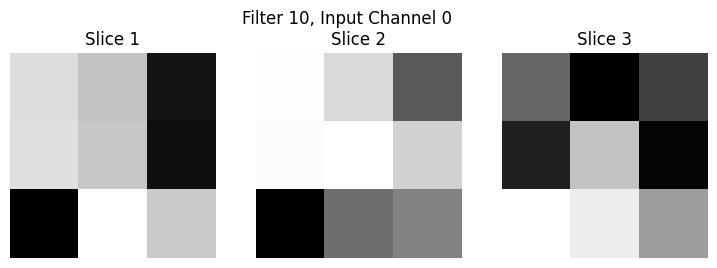

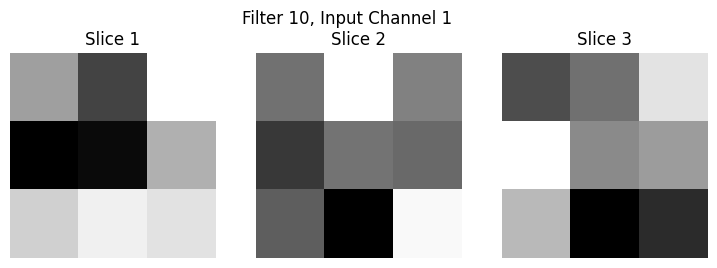

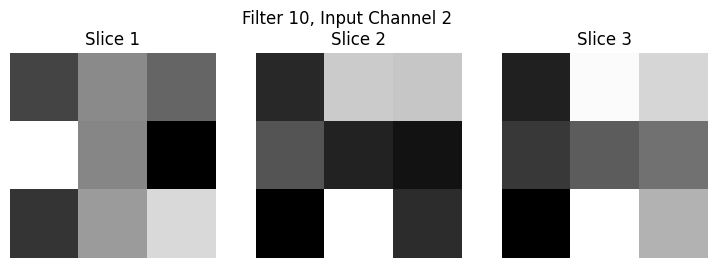

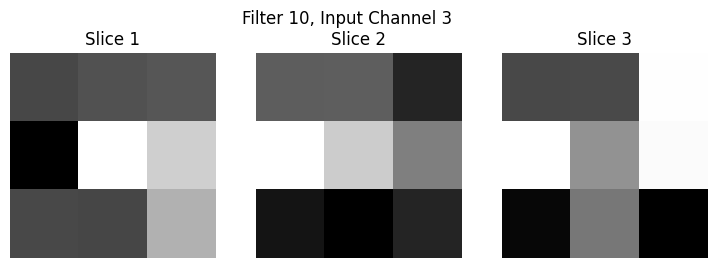

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming `conv3d_layer` is the 3D convolution layer in your model
conv3d_layer = model.layers[1]  # Replace with the actual layer index/name

# Get the kernel weights
kernels, biases = conv3d_layer.get_weights()  # kernels shape: (3, 3, 3, 4, 32)

# Choose a specific output filter, for example, the first filter
filter_index = 10  # You can change this to visualize other filters

# Extract the 3x3x3 kernel for each input channel for the chosen output filter
selected_kernel = kernels[:, :, :, :, filter_index]

# Visualize each input channel slice of the 3x3x3 kernel
for channel in range(selected_kernel.shape[-1]):  # Iterate over the input channels
    fig, axs = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(f'Filter {filter_index}, Input Channel {channel}')

    # Plot the 3 slices of the kernel (depth-wise slices)
    for i in range(3):  # Kernel has depth 3
        axs[i].imshow(selected_kernel[:, :, i, channel], cmap='gray')
        axs[i].set_title(f'Slice {i+1}')
        axs[i].axis('off')
    
    plt.show()

In [23]:
from tensorflow.keras.models import Model

# Create an intermediate model that outputs feature maps from the first Conv3D layer
intermediate_model = Model(inputs=model.input, outputs=conv3d_layer.output)

# Generate a random input with the shape (1, 64, 64, 64, 4)
input_volume = df.at[0,'Image']  # Modify with actual data if available
input_volume = np.expand_dims(input_volume, axis=0)
# Get the feature maps
feature_maps = intermediate_model.predict(input_volume)

# Feature maps shape: (1, 62, 62, 62, 32) assuming 'valid' padding
print(f'Feature map shape: {feature_maps.shape}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
Feature map shape: (1, 64, 64, 64, 32)


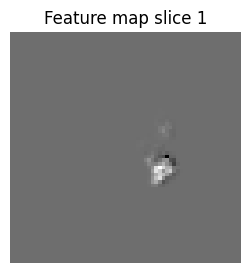

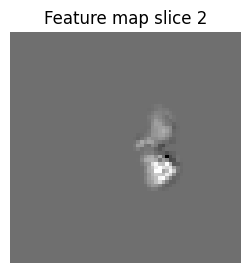

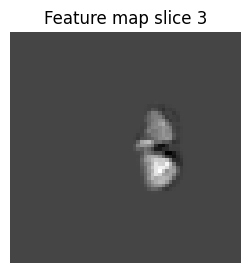

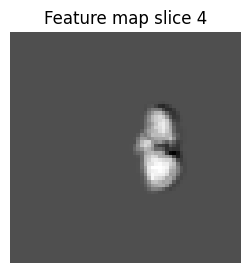

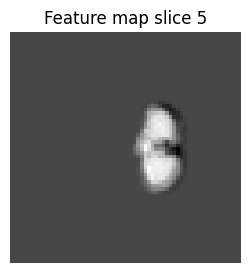

...

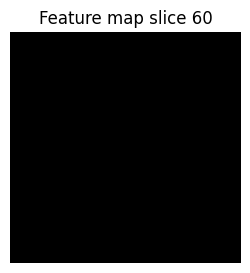

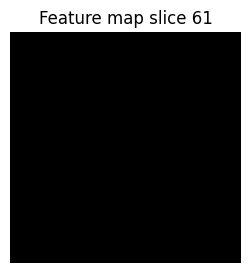

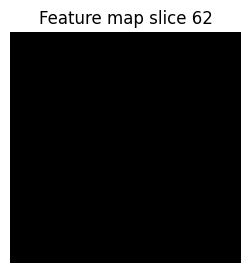

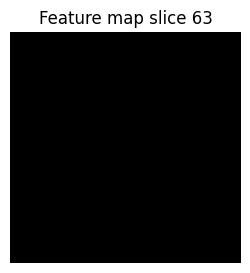

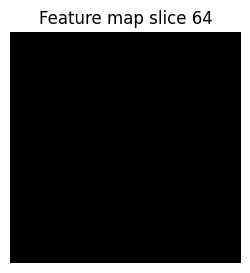

In [90]:
first_filter_feature_map = feature_maps[0, :, :, :, 10]  # Selecting the first filter of the output

# Plot slices along the z-axis (depth)
for i in range(first_filter_feature_map.shape[2]):
    plt.figure(figsize=(3, 3))
    plt.imshow(first_filter_feature_map[:, :, i], cmap='gray')
    plt.title(f'Feature map slice {i+1}')
    plt.axis('off')
    plt.show()

In [94]:
volume = first_filter_feature_map[:, :, :]

In [95]:
# Normalize the volume
volume_normalized = (volume - np.min(volume)) / (np.max(volume) - np.min(volume))

In [75]:
import plotly.graph_objects as go

# Create a 3D volume rendering
fig = go.Figure(data=go.Volume(
    x=np.linspace(0, volume_normalized.shape[2], volume_normalized.shape[2]),  # X-axis
    y=np.linspace(0, volume_normalized.shape[1], volume_normalized.shape[1]),  # Y-axis
    z=np.linspace(0, volume_normalized.shape[0], volume_normalized.shape[0]),  # Z-axis
    value=volume_normalized.flatten(),  # Flatten the normalized 3D data
    opacity=0.3,  # Adjust opacity
    surface_count=30,  # Adjust this for more layers
    colorscale='Viridis',  # Change colorscale if needed
))

# Display the 3D volume rendering
fig.show()

In [99]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Volume(
    x=np.repeat(np.arange(volume_normalized.shape[2]), volume_normalized.shape[1] * volume_normalized.shape[0]),
    y=np.tile(np.repeat(np.arange(volume_normalized.shape[1]), volume_normalized.shape[0]), volume_normalized.shape[2]),
    z=np.tile(np.arange(volume_normalized.shape[0]), volume_normalized.shape[1] * volume_normalized.shape[2]),
    value=volume_normalized.flatten(),
    opacity=0.3,
    surface_count=20,
    colorscale='Viridis'
))

# Display the 3D volume rendering
fig.show()

In [100]:
def save_volume_as_ply(volume, filename='output.ply'):
    with open(filename, 'w') as f:
        # Write the PLY header
        f.write("ply\n")
        f.write("format ascii 1.0\n")
        f.write(f"element vertex {np.prod(volume.shape)}\n")
        f.write("property float x\n")
        f.write("property float y\n")
        f.write("property float z\n")
        f.write("property uchar red\n")
        f.write("property uchar green\n")
        f.write("property uchar blue\n")
        f.write("end_header\n")

        # Write the vertex data
        for z in range(volume.shape[0]):
            for y in range(volume.shape[1]):
                for x in range(volume.shape[2]):
                    value = volume[z, y, x]
                    # Normalize to 0-255 for RGB values
                    color = int(value * 255)
                    f.write(f"{x} {y} {z} {color} {color} {color}\n")  # Grayscale color

# Save the volume as a PLY file
save_volume_as_ply(volume_normalized, '3d_volume.ply')

Feature map shape: (1, 64, 64, 64, 32)
Feature map min value: -0.38146042823791504
Feature map max value: 0.456177294254303


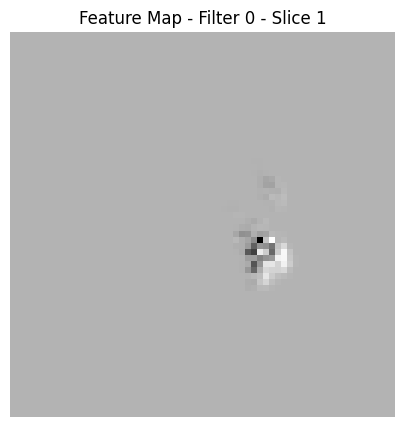

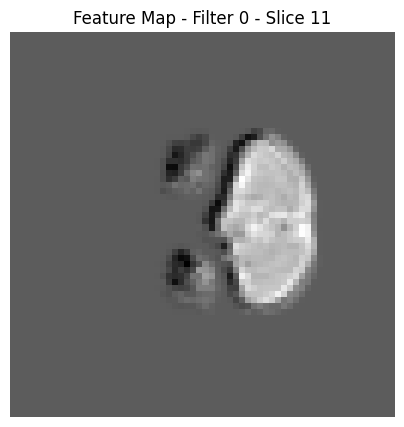

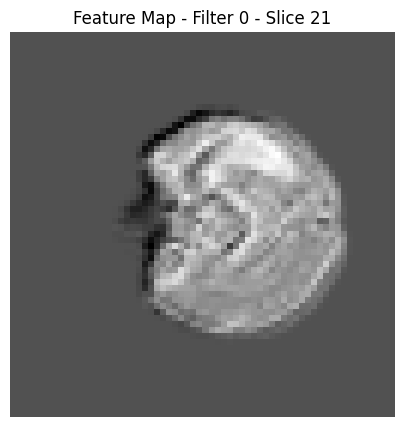

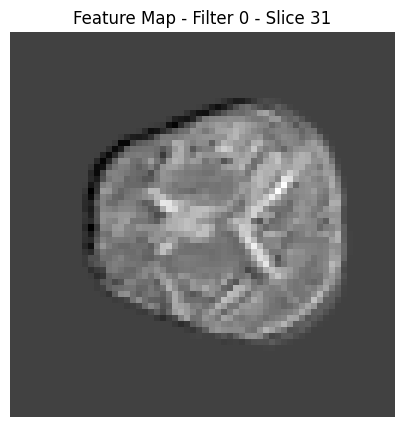

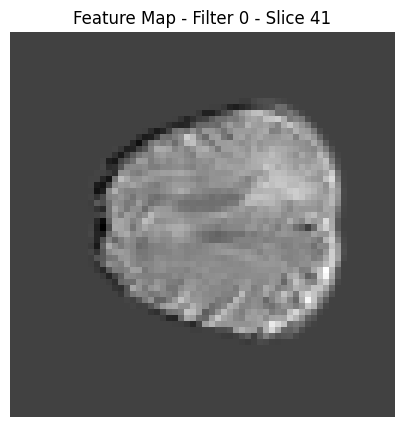

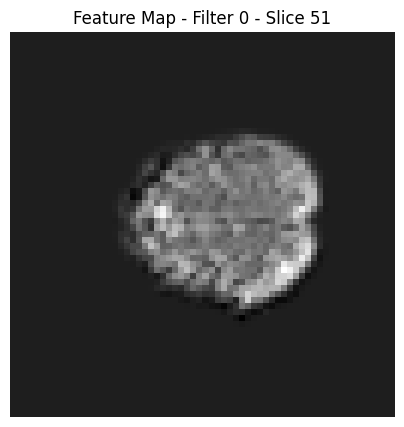

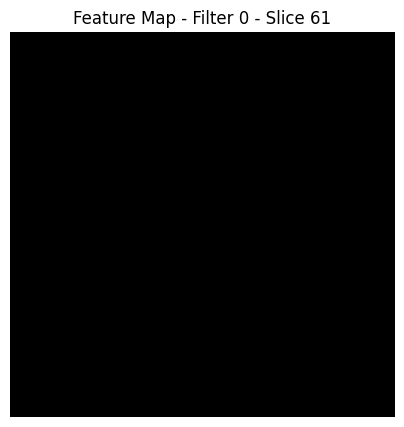

In [45]:
import numpy as np
import plotly.graph_objects as go

print(f'Feature map shape: {feature_maps.shape}')  # Should be (1, depth, height, width, num_filters)
filter_index = 0
feature_map = feature_maps[0, :, :, :, filter_index]  # Get the feature map for the chosen filter

# Check the minimum and maximum values
print(f'Feature map min value: {np.min(feature_map)}')
print(f'Feature map max value: {np.max(feature_map)}')


for i in range(0, feature_map.shape[2], 10):  # Show every 10th slice for clarity
    plt.figure(figsize=(5, 5))
    plt.imshow(feature_map[:, :, i], cmap='gray')
    plt.title(f'Feature Map - Filter {filter_index} - Slice {i+1}')
    plt.axis('off')
    plt.show()

# Normalize only if necessary
if np.max(feature_map) > 0:
    feature_map_normalized = (feature_map - np.min(feature_map)) / (np.max(feature_map) - np.min(feature_map))
else:
    feature_map_normalized = feature_map  # Avoid division by zero

In [46]:
fig = go.Figure(data=go.Volume(
    x=np.linspace(0, feature_map_normalized.shape[2], feature_map_normalized.shape[2]),  # X-axis
    y=np.linspace(0, feature_map_normalized.shape[1], feature_map_normalized.shape[1]),  # Y-axis
    z=np.linspace(0, feature_map_normalized.shape[0], feature_map_normalized.shape[0]),  # Z-axis
    value=feature_map_normalized.flatten(),  # Flatten the normalized 3D data
    opacity=0.3,  # Adjust opacity
    surface_count=30,  # Adjust this for more layers
    colorscale='Viridis',  # Change colorscale if needed
))

fig.show()

In [47]:
# Ensure all values are non-negative
feature_map_shifted = feature_map - np.min(feature_map)  # Shift to make minimum zero
# Normalize to the range [0, 1]
feature_map_normalized = feature_map_shifted / np.max(feature_map_shifted)

In [48]:
import plotly.graph_objects as go

# Create a 3D volume rendering
fig = go.Figure(data=go.Volume(
    x=np.linspace(0, feature_map_normalized.shape[2], feature_map_normalized.shape[2]),  # X-axis
    y=np.linspace(0, feature_map_normalized.shape[1], feature_map_normalized.shape[1]),  # Y-axis
    z=np.linspace(0, feature_map_normalized.shape[0], feature_map_normalized.shape[0]),  # Z-axis
    value=feature_map_normalized.flatten(),  # Flatten the normalized 3D data
    opacity=0.3,  # Adjust opacity
    surface_count=30,  # Number of surfaces to render
    colorscale='Viridis',  # Change colorscale if needed
))

# Display the 3D volume rendering
fig.show()

In [ ]:
synthetic_volume = np.zeros((64, 64, 64))

# Create a simple gradient for visualization
for i in range(64):
    for j in range(64):
        synthetic_volume[i, j, :] = (i + j) / (63 * 2)  # Gradient along the depth

# Normalize synthetic volume
synthetic_volume_normalized = synthetic_volume / np.max(synthetic_volume)

# 3D Volume Rendering of Synthetic Data
fig = go.Figure(data=go.Volume(
    x=np.linspace(0, synthetic_volume_normalized.shape[2], synthetic_volume_normalized.shape[2]),
    y=np.linspace(0, synthetic_volume_normalized.shape[1], synthetic_volume_normalized.shape[1]),
    z=np.linspace(0, synthetic_volume_normalized.shape[0], synthetic_volume_normalized.shape[0]),
    value=synthetic_volume_normalized.flatten(),
    opacity=0.3,
    surface_count=30,
    colorscale='Viridis',
))

fig.show()

In [10]:
scaler = MinMaxScaler()
temp_image_t1=resize_nii_image(nib.load(t1_list[0])).get_fdata()
image_data=scaler.fit_transform(temp_image_t1.reshape(-1, temp_image_t1.shape[-1])).reshape(temp_image_t1.shape)

In [102]:
!pip install mayavi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 38.4 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 34.5 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 58.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 37.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.0/230.0 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.9/268.9 kB 13.6 MB/s eta 0:00:00
  Created wheel for mayavi: filename=mayavi-4.8.2-cp310-cp310-linux_x86_64.whl size=16700760 sha256=d7416e4c558888cd9c8f707e27c4fa25fc543a7d851cc08988b93c763f8860ec
  Stored in directory: /root/.cache/pip/wheels/60/52/8c/d16aeced951729965d3a787b59424bfc235372fafd1130c56e
Successfully built mayavi


In [ ]:
from mayavi import mlab

# Visualize the volume using Mayavi
def visualize_volume(volume):
    # Create an empty figure
    mlab.figure(size=(800, 800), bgcolor=(1, 1, 1))

    # Create a scalar field from the volume
    src = mlab.pipeline.scalar_field(volume)

    # Create an isosurface
    mlab.pipeline.iso_surface(src, contours=[0.5], opacity=0.5)

    # Add axes
    mlab.axes(xlabel='X', ylabel='Y', zlabel='Z')
    mlab.title('3D Volume Visualization')

    # Show the visualization
    mlab.show()

# Call the visualization function
visualize_volume(volume_normalized)

In [104]:
import plotly.graph_objects as go

image_data = temp_image_t1

# Create the 3D volume rendering
fig = go.Figure(data=go.Volume(
    x=np.repeat(np.arange(image_data.shape[2]), image_data.shape[1] * image_data.shape[0]),
    y=np.tile(np.repeat(np.arange(image_data.shape[1]), image_data.shape[0]), image_data.shape[2]),
    z=np.tile(np.arange(image_data.shape[0]), image_data.shape[1] * image_data.shape[2]),
    value=image_data.flatten(),
    opacity=0.1,  # Adjust opacity for better visualization
    surface_count=20,  # Adjust this for more layers
    colorscale='Viridis',  # Change colorscale if needed
))

# Save the figure as a PNG image
# import plotly.io as pio
# pio.write_image(fig, '3d_volume_rendering.png')

# Display the 3D volume rendering
fig.show()

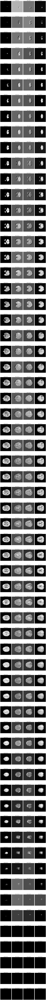

In [106]:
import matplotlib.pyplot as plt

# Assuming first_filter_feature_map contains feature maps for 3 specific filters
filter_indices = [0, 2, 4]  # Indices for the first, third, and fifth filters

# Select slices along the z-axis
n_slices = first_filter_feature_map.shape[2]
n_filters = len(filter_indices)

# Create a figure with subplots
fig, axes = plt.subplots(n_slices, n_filters + 1, figsize=(15, 5 * n_slices))

# Plot original image slices and corresponding feature map slices
for i in range(0,n_slices):
    # Plot original image
    axes[i, 0].imshow(image_data[:, :, i], cmap='gray')  # Use the original image
    axes[i, 0].set_title(f'Original Slice {i + 1}')
    axes[i, 0].axis('off')
    
    # Plot each selected filter feature map
    for j, filter_index in enumerate(filter_indices):
        feature_map_slice = feature_maps[0, :, :, :, filter_index][:, :, i]  # Get the slice for the filter
        axes[i, j + 1].imshow(feature_map_slice, cmap='gray')
        axes[i, j + 1].set_title(f'Filter {filter_index + 1} Slice {i + 1}')
        axes[i, j + 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

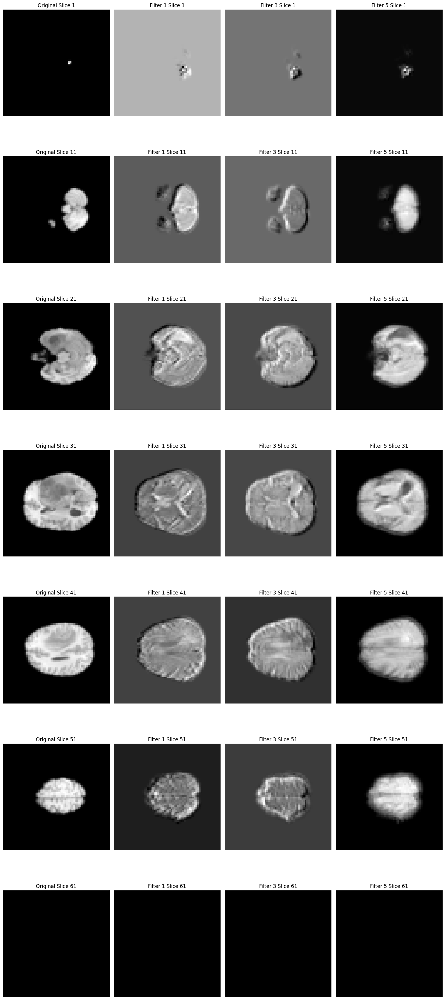

In [107]:
filter_indices = [0, 2, 4]  # Indices for the first, third, and fifth filters

# Select slices along the z-axis
n_slices = first_filter_feature_map.shape[2]
n_filters = len(filter_indices)

# Create a figure with subplots
fig, axes = plt.subplots(n_slices // 10 + 1, n_filters + 1, figsize=(15, 5 * (n_slices // 10 + 1)))

# Plot original image slices and corresponding feature map slices
for i in range(0, n_slices, 10):  # Step by 10
    # Plot original image
    axes[i // 10, 0].imshow(image_data[:, :, i], cmap='gray')  # Use the original image
    axes[i // 10, 0].set_title(f'Original Slice {i + 1}')
    axes[i // 10, 0].axis('off')
    
    # Plot each selected filter feature map
    for j, filter_index in enumerate(filter_indices):
        feature_map_slice = feature_maps[0, :, :, :, filter_index][:, :, i]  # Get the slice for the filter
        axes[i // 10, j + 1].imshow(feature_map_slice, cmap='gray')
        axes[i // 10, j + 1].set_title(f'Filter {filter_index + 1} Slice {i + 1}')
        axes[i // 10, j + 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


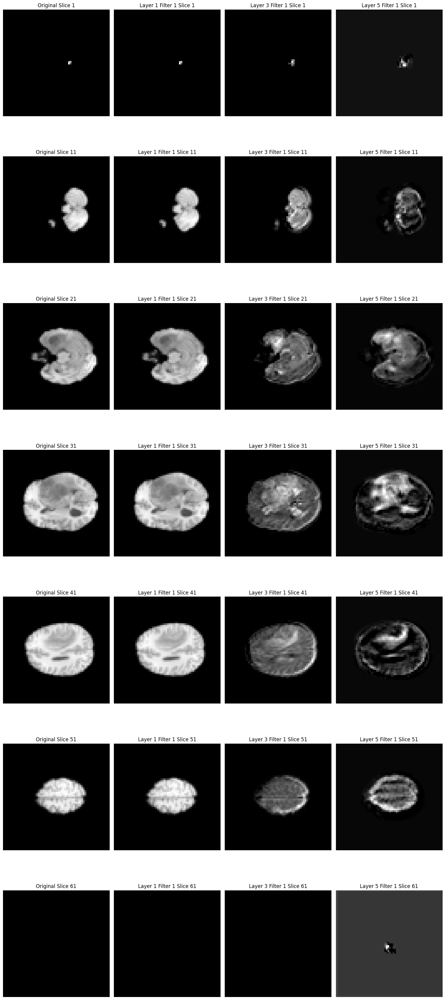

In [25]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import Model


# Layers to extract feature maps from (1st, 3rd, 5th layers)
layers_indices = [0, 2, 4]  # Indices of the layers from which to extract the feature maps
filter_index = 0  # We're interested in the 1st filter

# Select slices along the z-axis (depth)
n_slices = image_data.shape[2]

# Create a figure with subplots for each layer's filter map
fig, axes = plt.subplots(n_slices // 10 + 1, len(layers_indices) + 1, figsize=(15, 5 * (n_slices // 10 + 1)))

# Loop through layers to extract feature maps
for layer_idx, layer_number in enumerate(layers_indices):
    intermediate_model = Model(inputs=model.input, outputs=model.layers[layer_number].output)
    
    # Ensure the input image is of shape (1, 64, 64, 64, 4)
    feature_maps = intermediate_model.predict(np.expand_dims(image_data, axis=0))
    
    # Get the feature map for the 1st filter in the current layer
    current_layer_feature_map = feature_maps[0, :, :, :, filter_index]  # Feature map for filter 1
    
    # Plot every 10th slice
    for i in range(0, n_slices, 10):  # Step by 10
        row_idx = i // 10
        
        # Plot original image slice in the first column
        if layer_idx == 0:
            axes[row_idx, 0].imshow(image_data[:, :, i, 0], cmap='gray')  # Visualizing 1st channel of original image
            axes[row_idx, 0].set_title(f'Original Slice {i + 1}')
            axes[row_idx, 0].axis('off')
        
        # Plot the corresponding filter's feature map slice from the current layer
        feature_map_slice = current_layer_feature_map[:, :, i]
        axes[row_idx, layer_idx + 1].imshow(feature_map_slice, cmap='gray')
        axes[row_idx, layer_idx + 1].set_title(f'Layer {layer_number + 1} Filter {filter_index + 1} Slice {i + 1}')
        axes[row_idx, layer_idx + 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()
